In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import altair as alt
alt.renderers.enable('notebook')

RendererRegistry.enable('notebook')

In [3]:
!ls ecfp6/

conv.csv                   lstm.csv
dnn.csv                    nb.csv
dnn_prc.csv                rf.csv
fold_info.csv              sea.csv
knn.csv                    svm.csv
labelsWeakHard.targetNames weave.csv


# Load data and compute std errors for AUC values on each test fold #

In [4]:
fold_info_df = pd.read_csv('./ecfp6/fold_info.csv')

fold_info_df['n_actives0'] = round(fold_info_df['test_size0']*fold_info_df['test_imb0'])
fold_info_df['n_inactives0'] = round(fold_info_df['test_size0']*(1-fold_info_df['test_imb0']))

fold_info_df['n_actives1'] = round(fold_info_df['test_size1']*fold_info_df['test_imb1'])
fold_info_df['n_inactives1'] = round(fold_info_df['test_size1']*(1-fold_info_df['test_imb1']))

fold_info_df['n_actives2'] = round(fold_info_df['test_size2']*fold_info_df['test_imb2'])
fold_info_df['n_inactives2'] = round(fold_info_df['test_size2']*(1-fold_info_df['test_imb2']))

fold_info_df.head()

,train_size0,train_size1,train_size2,test_size0,test_size1,test_size2,train_imb0,train_imb1,train_imb2,test_imb0,test_imb1,test_imb2,n_actives0,n_inactives0,n_actives1,n_inactives1,n_actives2,n_inactives2
0,24,32,24,16,8,16,0.833333,0.843750,0.875000,0.875000,0.875000,0.812500,14.0,2.0,7.0,1.0,13.0,3.0
1,9,42,39,36,3,6,0.555556,0.500000,0.512821,0.500000,0.666667,0.500000,18.0,18.0,2.0,1.0,3.0,3.0
2,53,30,51,14,37,16,0.773585,0.600000,0.843137,0.714286,0.891892,0.500000,10.0,4.0,33.0,4.0,8.0,8.0
3,85,69,36,10,26,59,0.929412,0.971014,0.833333,0.900000,0.807692,0.983051,9.0,1.0,21.0,5.0,58.0,1.0
4,52,37,59,22,37,15,0.865385,0.891892,0.847458,0.863636,0.837838,0.933333,19.0,3.0,31.0,6.0,14.0,1.0


In [5]:
def classical_AUC_CI(AUC, n_actives, n_inactives):
    '''
    Function to compute confidence intervals for AUC values
    Uses the form provided in Nicholls (2014)
    Note that returned intervals are often asymmetric.
    '''
    import scipy.stats
    
    var_active = ((AUC**2)*(1-AUC)/(1+AUC))/n_actives
    var_inactive = (AUC*((1-AUC)**2)/(2-AUC))/n_inactives
    
    df_eff = (
        (((var_active/n_actives)+(var_inactive/n_inactives))**2) / 
        (
            (((var_active/n_actives)**2)/(n_actives-1)) +
            (((var_inactive/n_inactives)**2)/(n_inactives-1))
        )
    )
    
    std_error = np.sqrt(var_active+var_inactive)
    
    # transform to new space where continuous
    logit_auc = np.log(AUC/(1-AUC))
    logit_std_error = std_error * (1/(AUC*(1-AUC)))
    
    t_95 = scipy.stats.t.ppf(0.975,df_eff)
    logit_lower_limit = logit_auc - t_95*logit_std_error
    logit_upper_limit = logit_auc + t_95*logit_std_error
    
    lower_limit = 1/(1+np.exp(-1*logit_lower_limit))
    upper_limit = 1/(1+np.exp(-1*logit_upper_limit))
    
    return lower_limit, upper_limit, std_error
    #return std_error

In [6]:
print('95% confidence interval for AUC=0.9, 10 actives, many inactives (10000)')
print(classical_AUC_CI(0.9, 10, 10000)[0:2])

95% confidence interval for AUC=0.9, 10 actives, many inactives (10000)
(0.635509349601759, 0.9789282125123518)


In [7]:
fnn_df = pd.read_csv('./ecfp6/dnn.csv')
fnn_df = fnn_df[['ECFP6: fold0', 'ECFP6: fold1', 'ECFP6: fold2']]
fnn_df = fnn_df.rename(columns={'ECFP6: fold0': "fold0",
                       'ECFP6: fold1': "fold1",
                       'ECFP6: fold2': "fold2",})
fnn_df['mean_auc'] = fnn_df.mean(axis=1)
fnn_df['std_auc'] = fnn_df.std(axis=1)

fnn_df['std_error0'] = classical_AUC_CI(fnn_df['fold0'],
                                        fold_info_df['n_actives0'],
                                        fold_info_df['n_inactives0'])[-1]
fnn_df['std_error1'] = classical_AUC_CI(fnn_df['fold1'],
                                        fold_info_df['n_actives1'],
                                        fold_info_df['n_inactives1'])[-1]
fnn_df['std_error2'] = classical_AUC_CI(fnn_df['fold2'],
                                        fold_info_df['n_actives2'],
                                        fold_info_df['n_inactives2'])[-1]

fnn_df.head()

/Users/matthewrobinson/anaconda/envs/mlbook/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:872: RuntimeWarning: invalid value encountered in greater
  cond = logical_and(cond, (asarray(arg) > 0))
/Users/matthewrobinson/anaconda/envs/mlbook/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in log


,fold0,fold1,fold2,mean_auc,std_auc,std_error0,std_error1,std_error2
0,0.785714,1.000000,0.948718,0.911477,0.091359,0.141942,0.000000,0.051118
1,0.691358,0.000000,0.555556,0.415638,0.299084,0.087416,0.000000,0.233921
2,0.675000,0.893939,0.562500,0.710480,0.137616,0.149307,0.060241,0.142956
3,1.000000,0.819048,1.000000,0.939683,0.085302,0.000000,0.087861,0.000000
4,0.842105,1.000000,1.000000,0.947368,0.074432,0.096140,0.000000,0.000000


Note that the divide by zero error occurs because there are situations in which a fold contains only one active or inactive compound. Therefore, the degrees of freedom calculation fails in these cases.

In [8]:
knn_df = pd.read_csv('./ecfp6/knn.csv')
knn_df = knn_df[['fold0', 'fold1', 'fold2']]
knn_df['mean_auc'] = knn_df.mean(axis=1)
knn_df['std_auc'] = knn_df.std(axis=1)

knn_df['std_error0'] = classical_AUC_CI(knn_df['fold0'],
                                        fold_info_df['n_actives0'],
                                        fold_info_df['n_inactives0'])[-1]
knn_df['std_error1'] = classical_AUC_CI(knn_df['fold1'],
                                        fold_info_df['n_actives1'],
                                        fold_info_df['n_inactives1'])[-1]
knn_df['std_error2'] = classical_AUC_CI(knn_df['fold2'],
                                        fold_info_df['n_actives2'],
                                        fold_info_df['n_inactives2'])[-1]

knn_df.head()

/Users/matthewrobinson/anaconda/envs/mlbook/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in log
/Users/matthewrobinson/anaconda/envs/mlbook/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:872: RuntimeWarning: invalid value encountered in greater
  cond = logical_and(cond, (asarray(arg) > 0))


,fold0,fold1,fold2,mean_auc,std_auc,std_error0,std_error1,std_error2
0,0.785714,0.428571,0.820513,0.678266,0.177131,0.141942,0.315515,0.112143
1,0.651235,0.000000,0.444444,0.365226,0.271702,0.090771,0.000000,0.233921
2,0.750000,0.643939,0.296875,0.563605,0.193513,0.131950,0.133312,0.129403
3,0.666667,0.685714,0.982759,0.778380,0.144727,0.255797,0.120339,0.020784
4,0.912281,0.903226,1.000000,0.938502,0.043642,0.064502,0.051221,0.000000


In [9]:
nb_df = pd.read_csv('./ecfp6/nb.csv')
nb_df = nb_df[['fold0', 'fold1', 'fold2']]
nb_df['mean_auc'] = nb_df.mean(axis=1)
nb_df['std_auc'] = nb_df.std(axis=1)

nb_df['std_error0'] = classical_AUC_CI(nb_df['fold0'],
                                        fold_info_df['n_actives0'],
                                        fold_info_df['n_inactives0'])[-1]
nb_df['std_error1'] = classical_AUC_CI(nb_df['fold1'],
                                        fold_info_df['n_actives1'],
                                        fold_info_df['n_inactives1'])[-1]
nb_df['std_error2'] = classical_AUC_CI(nb_df['fold2'],
                                        fold_info_df['n_actives2'],
                                        fold_info_df['n_inactives2'])[-1]

nb_df.head()

/Users/matthewrobinson/anaconda/envs/mlbook/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in log
/Users/matthewrobinson/anaconda/envs/mlbook/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:872: RuntimeWarning: invalid value encountered in greater
  cond = logical_and(cond, (asarray(arg) > 0))


,fold0,fold1,fold2,mean_auc,std_auc,std_error0,std_error1,std_error2
0,0.714286,0.142857,0.641026,0.499389,0.253874,0.169557,0.242284,0.164851
1,0.956790,0.000000,0.222222,0.393004,0.408849,0.034903,0.000000,0.188894
2,0.425000,0.712121,0.234375,0.457165,0.196361,0.172025,0.118491,0.118260
3,1.000000,0.723810,0.000000,0.574603,0.421661,0.000000,0.112472,0.000000
4,0.929825,1.000000,1.000000,0.976608,0.033081,0.055506,0.000000,0.000000


In [10]:
rf_df = pd.read_csv('./ecfp6/rf.csv')
rf_df = rf_df[['fold0', 'fold1', 'fold2']]
rf_df['mean_auc'] = rf_df.mean(axis=1)
rf_df['std_auc'] = rf_df.std(axis=1)

rf_df['std_error0'] = classical_AUC_CI(rf_df['fold0'],
                                        fold_info_df['n_actives0'],
                                        fold_info_df['n_inactives0'])[-1]
rf_df['std_error1'] = classical_AUC_CI(rf_df['fold1'],
                                        fold_info_df['n_actives1'],
                                        fold_info_df['n_inactives1'])[-1]
rf_df['std_error2'] = classical_AUC_CI(rf_df['fold2'],
                                        fold_info_df['n_actives2'],
                                        fold_info_df['n_inactives2'])[-1]

rf_df.head()

/Users/matthewrobinson/anaconda/envs/mlbook/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in log
/Users/matthewrobinson/anaconda/envs/mlbook/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:872: RuntimeWarning: invalid value encountered in greater
  cond = logical_and(cond, (asarray(arg) > 0))


,fold0,fold1,fold2,mean_auc,std_auc,std_error0,std_error1,std_error2
0,0.464286,0.571429,0.410256,0.481990,0.066979,0.221394,0.293584,0.187969
1,0.500000,0.000000,0.666667,0.388889,0.283279,0.096225,0.000000,0.219427
2,0.650000,0.712121,0.593750,0.651957,0.048345,0.153972,0.118491,0.141221
3,1.000000,0.904762,1.000000,0.968254,0.044896,0.000000,0.058716,0.000000
4,0.982456,1.000000,1.000000,0.994152,0.008270,0.023423,0.000000,0.000000


In [11]:
svm_df = pd.read_csv('./ecfp6/svm.csv')
svm_df = svm_df[['fold0', 'fold1', 'fold2']]
svm_df['mean_auc'] = svm_df.mean(axis=1)
svm_df['std_auc'] = svm_df.std(axis=1)

svm_df['std_error0'] = classical_AUC_CI(svm_df['fold0'],
                                        fold_info_df['n_actives0'],
                                        fold_info_df['n_inactives0'])[-1]
svm_df['std_error1'] = classical_AUC_CI(svm_df['fold1'],
                                        fold_info_df['n_actives1'],
                                        fold_info_df['n_inactives1'])[-1]
svm_df['std_error2'] = classical_AUC_CI(svm_df['fold2'],
                                        fold_info_df['n_actives2'],
                                        fold_info_df['n_inactives2'])[-1]

svm_df.head()

/Users/matthewrobinson/anaconda/envs/mlbook/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:872: RuntimeWarning: invalid value encountered in greater
  cond = logical_and(cond, (asarray(arg) > 0))
/Users/matthewrobinson/anaconda/envs/mlbook/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in log


,fold0,fold1,fold2,mean_auc,std_auc,std_error0,std_error1,std_error2
0,0.535714,0.714286,0.487179,0.579060,0.097651,0.213610,0.239790,0.185811
1,0.867284,0.000000,1.000000,0.622428,0.443445,0.060986,0.000000,0.000000
2,0.750000,0.803030,0.343750,0.632260,0.205153,0.131950,0.092962,0.135596
3,1.000000,0.628571,0.775862,0.801478,0.152713,0.000000,0.130143,0.182074
4,0.964912,1.000000,1.000000,0.988304,0.016541,0.035463,0.000000,0.000000


In [12]:
gc_df = pd.read_csv('./ecfp6/conv.csv')
gc_df = gc_df[['fold0', 'fold1', 'fold2']]
gc_df['mean_auc'] = gc_df.mean(axis=1)
gc_df['std_auc'] = gc_df.std(axis=1)

gc_df['std_error0'] = classical_AUC_CI(gc_df['fold0'],
                                        fold_info_df['n_actives0'],
                                        fold_info_df['n_inactives0'])[-1]
gc_df['std_error1'] = classical_AUC_CI(gc_df['fold1'],
                                        fold_info_df['n_actives1'],
                                        fold_info_df['n_inactives1'])[-1]
gc_df['std_error2'] = classical_AUC_CI(gc_df['fold2'],
                                        fold_info_df['n_actives2'],
                                        fold_info_df['n_inactives2'])[-1]

gc_df.head()

/Users/matthewrobinson/anaconda/envs/mlbook/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:872: RuntimeWarning: invalid value encountered in greater
  cond = logical_and(cond, (asarray(arg) > 0))
/Users/matthewrobinson/anaconda/envs/mlbook/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in log


,fold0,fold1,fold2,mean_auc,std_auc,std_error0,std_error1,std_error2
0,0.375000,0.571429,0.615385,0.520604,0.104510,0.222796,0.293584,0.169857
1,0.787037,0.250000,0.777778,0.604938,0.251008,0.075735,0.314813,0.188894
2,0.787500,0.833333,0.414062,0.678299,0.187778,0.121262,0.082906,0.141721
3,1.000000,0.876190,1.000000,0.958730,0.058364,0.000000,0.069301,0.000000
4,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000


In [13]:
weave_df = pd.read_csv('./ecfp6/weave.csv')
weave_df = weave_df[['fold0', 'fold1', 'fold2']]
weave_df['mean_auc'] = weave_df.mean(axis=1)
weave_df['std_auc'] = weave_df.std(axis=1)

weave_df['std_error0'] = classical_AUC_CI(weave_df['fold0'],
                                        fold_info_df['n_actives0'],
                                        fold_info_df['n_inactives0'])[-1]
weave_df['std_error1'] = classical_AUC_CI(weave_df['fold1'],
                                        fold_info_df['n_actives1'],
                                        fold_info_df['n_inactives1'])[-1]
weave_df['std_error2'] = classical_AUC_CI(weave_df['fold2'],
                                        fold_info_df['n_actives2'],
                                        fold_info_df['n_inactives2'])[-1]

weave_df.head()

/Users/matthewrobinson/anaconda/envs/mlbook/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:872: RuntimeWarning: invalid value encountered in greater
  cond = logical_and(cond, (asarray(arg) > 0))
/Users/matthewrobinson/anaconda/envs/mlbook/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in log


,fold0,fold1,fold2,mean_auc,std_auc,std_error0,std_error1,std_error2
0,0.250000,0.714286,0.692308,0.552198,0.213874,0.207020,0.239790,0.153005
1,0.475309,0.000000,0.777778,0.417695,0.320129,0.096082,0.000000,0.188894
2,0.700000,0.886364,0.687500,0.757955,0.090942,0.144092,0.063274,0.131663
3,1.000000,0.790476,0.965517,0.918664,0.091729,0.000000,0.096021,0.037306
4,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000


In [14]:
lstm_df = pd.read_csv('./ecfp6/lstm.csv')
lstm_df = lstm_df[['fold0', 'fold1', 'fold2']]
lstm_df['mean_auc'] = lstm_df.mean(axis=1)
lstm_df['std_auc'] = lstm_df.std(axis=1)

lstm_df['std_error0'] = classical_AUC_CI(lstm_df['fold0'],
                                        fold_info_df['n_actives0'],
                                        fold_info_df['n_inactives0'])[-1]
lstm_df['std_error1'] = classical_AUC_CI(lstm_df['fold1'],
                                        fold_info_df['n_actives1'],
                                        fold_info_df['n_inactives1'])[-1]
lstm_df['std_error2'] = classical_AUC_CI(lstm_df['fold2'],
                                        fold_info_df['n_actives2'],
                                        fold_info_df['n_inactives2'])[-1]

lstm_df.head()

/Users/matthewrobinson/anaconda/envs/mlbook/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in log
/Users/matthewrobinson/anaconda/envs/mlbook/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:872: RuntimeWarning: invalid value encountered in greater
  cond = logical_and(cond, (asarray(arg) > 0))


,fold0,fold1,fold2,mean_auc,std_auc,std_error0,std_error1,std_error2
0,0.535714,0.428571,0.897436,0.620574,0.200598,0.213610,0.315515,0.078759
1,0.540123,0.500000,0.333333,0.457819,0.089536,0.095846,0.353553,0.219427
2,0.575000,0.856061,0.609375,0.680145,0.125180,0.164750,0.074822,0.140087
3,1.000000,0.742857,1.000000,0.914286,0.121218,0.000000,0.108127,0.000000
4,0.929825,1.000000,1.000000,0.976608,0.033081,0.055506,0.000000,0.000000


In [15]:
canonical_order = pd.read_csv('./ecfp6/nb.csv').iloc[:,0]
canonical_order.head()

0    CHEMBL1614338
1    CHEMBL1243971
2    CHEMBL1614044
3    CHEMBL2045986
4     CHEMBL618396
Name: Unnamed: 0, dtype: object

# Reproduce some of their plots/results #

In [23]:
mean_aucs_df = pd.DataFrame({
    'FNN': fnn_df['mean_auc'],
    'SVM': svm_df['mean_auc'],
    'RF': rf_df['mean_auc'],
    'NB': nb_df['mean_auc'],
    'KNN': knn_df['mean_auc'],
    'WEAVE': weave_df['mean_auc'],
    'GC': gc_df['mean_auc'],
    'LSTM': lstm_df['mean_auc']
})
mean_aucs_df.head()

,FNN,SVM,RF,NB,KNN,WEAVE,GC,LSTM
0,0.911477,0.579060,0.481990,0.499389,0.678266,0.552198,0.520604,0.620574
1,0.415638,0.622428,0.388889,0.393004,0.365226,0.417695,0.604938,0.457819
2,0.710480,0.632260,0.651957,0.457165,0.563605,0.757955,0.678299,0.680145
3,0.939683,0.801478,0.968254,0.574603,0.778380,0.918664,0.958730,0.914286
4,0.947368,0.988304,0.994152,0.976608,0.938502,1.000000,1.000000,0.976608


Text(0,0.5,'AUC-ROC')

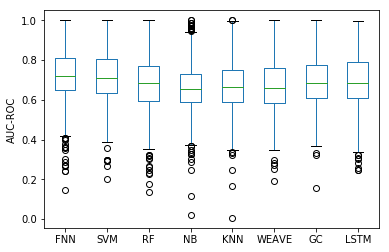

In [24]:
import seaborn as sns
mean_aucs_df.plot(kind='box')
plt.ylabel('AUC-ROC')

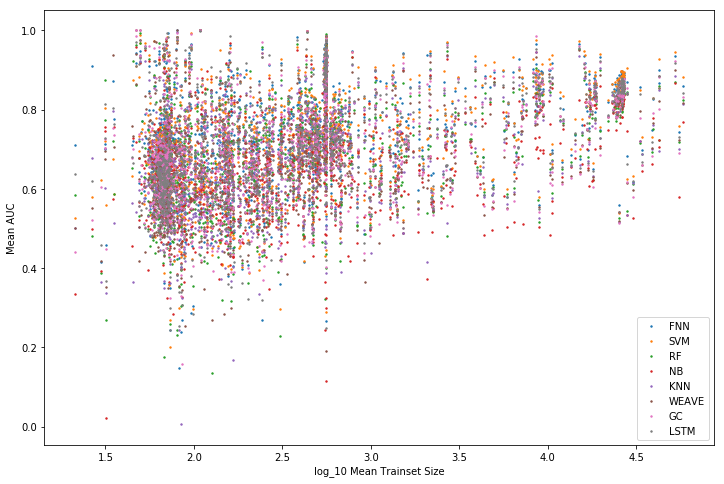

In [25]:
# compute trainset size as average of 3 folds? Unclear in original paper.
fold_info_df['mean_train_size'] = \
    fold_info_df[['train_size0', 'train_size1', 'train_size2']].mean(axis=1)
fold_info_df['mean_test_size'] = \
    fold_info_df[['test_size0', 'test_size1', 'test_size2']].mean(axis=1)

plt.figure(figsize=(12,8))
for col in list(mean_aucs_df.columns):
    plt.scatter(np.log10(fold_info_df['mean_train_size']),
                mean_aucs_df[col], s=2, label=col )
plt.legend()
plt.xlabel('log_10 Mean Trainset Size')
plt.ylabel('Mean AUC')
plt.show()


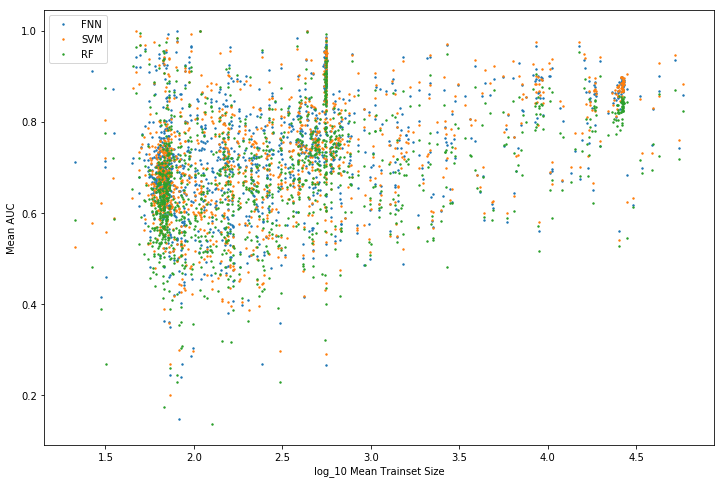

In [27]:
# restrict to FNN, SVM, and RF

plt.figure(figsize=(12,8))
for col in list(mean_aucs_df.columns):
    if col in ['FNN','SVM','RF']:
        plt.scatter(np.log10(fold_info_df['mean_train_size']),
                    mean_aucs_df[col], s=2, label=col )
plt.legend()
plt.xlabel('log_10 Mean Trainset Size')
plt.ylabel('Mean AUC')
plt.show()

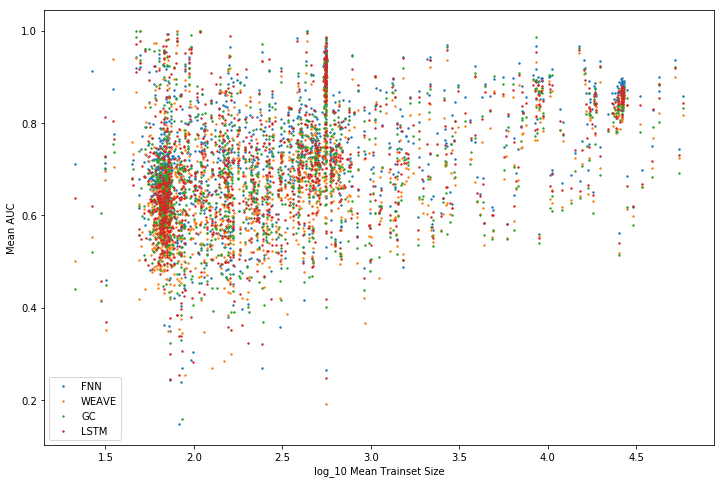

In [28]:
# restrict to deep learning methods

plt.figure(figsize=(12,8))
for col in list(mean_aucs_df.columns):
    if col in ['FNN','LSTM','GC','WEAVE']:
        plt.scatter(np.log10(fold_info_df['mean_train_size']),
                    mean_aucs_df[col], s=2, label=col )
plt.legend()
plt.xlabel('log_10 Mean Trainset Size')
plt.ylabel('Mean AUC')
plt.show()

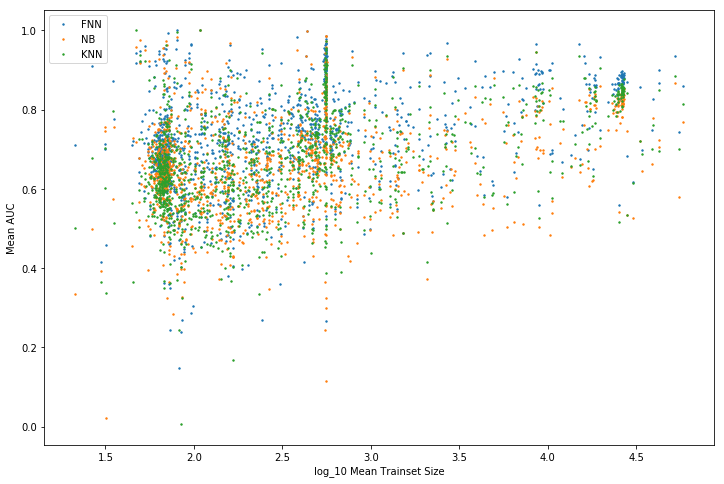

In [29]:
# compare FNN to simple methods such as NB and KNN

plt.figure(figsize=(12,8))
for col in list(mean_aucs_df.columns):
    if col in ['FNN','NB','KNN']:
        plt.scatter(np.log10(fold_info_df['mean_train_size']),
                    mean_aucs_df[col], s=2, label=col )
plt.legend()
plt.xlabel('log_10 Mean Trainset Size')
plt.ylabel('Mean AUC')
plt.show()

# Let's see how correlated the method mean AUC performances are: #

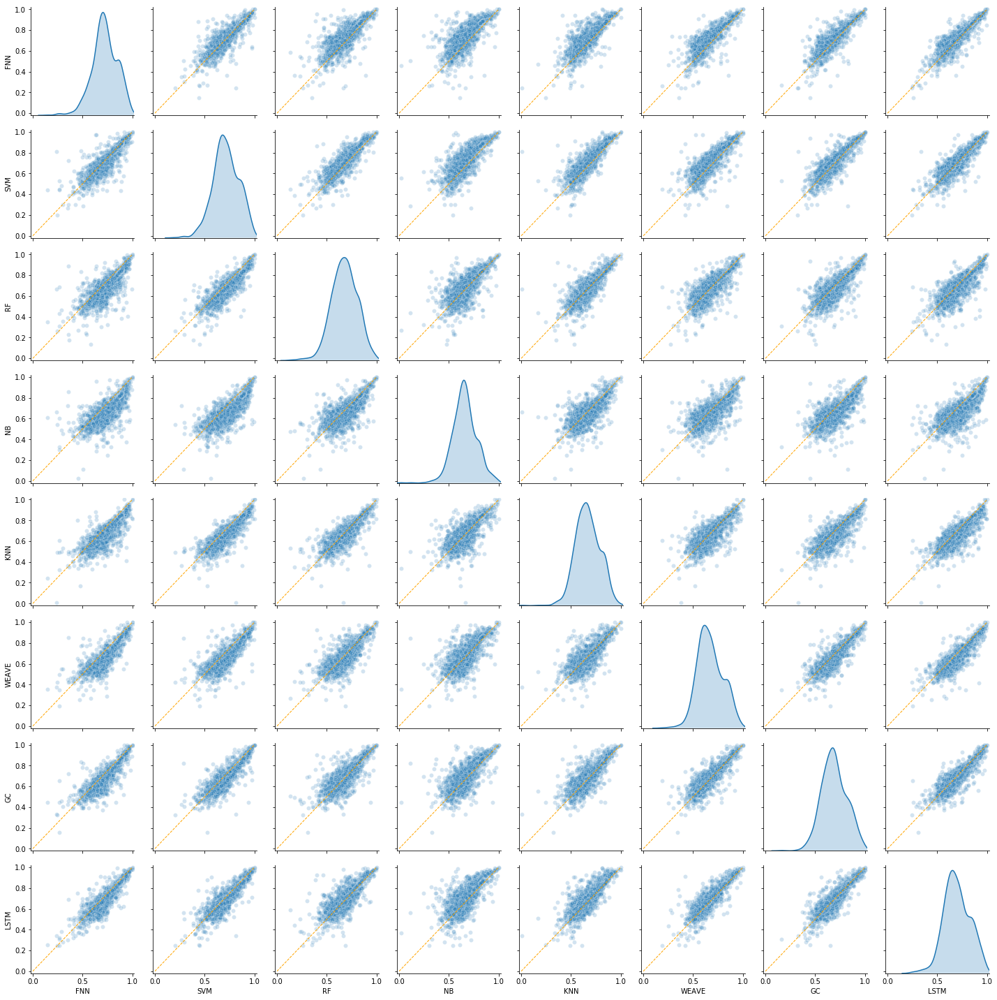

In [30]:
g = sns.pairplot(mean_aucs_df, diag_kind='kde', plot_kws={'alpha':0.2})

def plot_unity(xdata, ydata, **kwargs):
    mn = min(xdata.min(), ydata.min())
    mx = max(xdata.max(), ydata.max())
    points = np.linspace(0,1, 100)
    plt.gca().plot(points, points, color='orange', marker=None,
            linestyle='--', linewidth=1.0)

for row in g.axes:
    for x in row:
        x.set_xlim(-0.02,1.02)
        x.set_ylim(-0.02,1.02)
        
g.map_offdiag(plot_unity)

In [35]:
corr = mean_aucs_df.corr()
corr.style.background_gradient(cmap='coolwarm')

,FNN,SVM,RF,NB,KNN,WEAVE,GC,LSTM
FNN,1,0.844289,0.759925,0.704599,0.80311,0.837093,0.855634,0.888644
SVM,0.844289,1,0.863207,0.759618,0.849574,0.817922,0.856315,0.872883
RF,0.759925,0.863207,1,0.697126,0.81876,0.775566,0.779063,0.79362
NB,0.704599,0.759618,0.697126,1,0.70505,0.683644,0.702378,0.700951
KNN,0.80311,0.849574,0.81876,0.70505,1,0.770792,0.800071,0.822428
WEAVE,0.837093,0.817922,0.775566,0.683644,0.770792,1,0.855179,0.874194
GC,0.855634,0.856315,0.779063,0.702378,0.800071,0.855179,1,0.87396
LSTM,0.888644,0.872883,0.79362,0.700951,0.822428,0.874194,0.87396,1


How about if we only restrict to assays with large numbers of compounds:

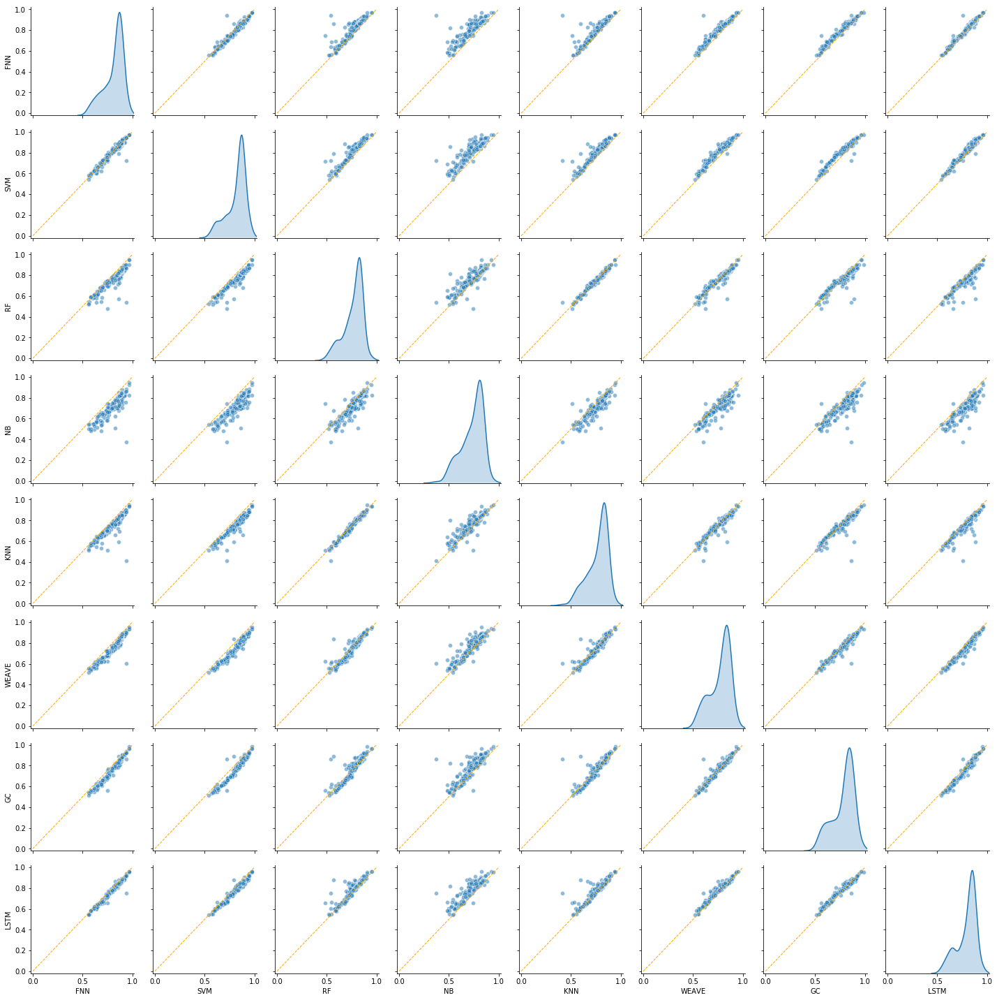

In [34]:
g = sns.pairplot(mean_aucs_df.loc[fold_info_df['mean_test_size'] > 1000]
                 , diag_kind='kde', plot_kws={'alpha':0.5})

def plot_unity(xdata, ydata, **kwargs):
    mn = min(xdata.min(), ydata.min())
    mx = max(xdata.max(), ydata.max())
    points = np.linspace(0,1, 100)
    plt.gca().plot(points, points, color='orange', marker=None,
            linestyle='--', linewidth=1.0)

for row in g.axes:
    for x in row:
        x.set_xlim(-0.02,1.02)
        x.set_ylim(-0.02,1.02)
        
g.map_offdiag(plot_unity)

In [36]:
corr = mean_aucs_df.loc[fold_info_df['mean_test_size'] > 1000].corr()
corr.style.background_gradient(cmap='coolwarm')

,FNN,SVM,RF,NB,KNN,WEAVE,GC,LSTM
FNN,1,0.96708,0.885085,0.851996,0.874327,0.957028,0.980398,0.981835
SVM,0.96708,1,0.942708,0.876989,0.934747,0.970883,0.968686,0.979822
RF,0.885085,0.942708,1,0.863839,0.985114,0.939169,0.906318,0.912024
NB,0.851996,0.876989,0.863839,1,0.89758,0.900079,0.847517,0.877016
KNN,0.874327,0.934747,0.985114,0.89758,1,0.940653,0.893536,0.908407
WEAVE,0.957028,0.970883,0.939169,0.900079,0.940653,1,0.966269,0.976392
GC,0.980398,0.968686,0.906318,0.847517,0.893536,0.966269,1,0.980559
LSTM,0.981835,0.979822,0.912024,0.877016,0.908407,0.976392,0.980559,1


# Perform the Wilcoxon Tests used in original paper: #

In [43]:
import scipy.stats

# note that they ran a one sided test, thus the pvalue should be divided by 2
test_stat, p_value = scipy.stats.wilcoxon(mean_aucs_df['FNN'],
                                          mean_aucs_df['SVM'])
print(f'one sided p-value for FNN > SVM: {p_value/2}')

one sided p-value for FNN > SVM: 1.9846108259182592e-07


In [44]:
# note that they ran a one sided test, thus the pvalue should be divided by 2
test_stat, p_value = scipy.stats.wilcoxon(mean_aucs_df['SVM'],
                                          mean_aucs_df['WEAVE'])
print(f'one sided p-value for SVM > WEAVE: {p_value/2}')

one sided p-value for SVM > WEAVE: 4.053503781679118e-94


These values agree with those reported in the original Mayr et al. paper

# Perform Simpler Sign Tests: #

In [50]:
import statsmodels.stats.proportion

wins = np.sum((mean_aucs_df['FNN'] - mean_aucs_df['SVM']) > 0)
losses = np.sum((mean_aucs_df['FNN'] - mean_aucs_df['SVM']) < 0)
# use convention of throwing away ties

statsmodels.stats.proportion.proportion_confint(wins,
                                                wins+losses,
                                                alpha=0.05, method='wilson')

(0.5099703578960647, 0.563915182013022)

In [53]:
import statsmodels.stats.proportion

wins = np.sum((mean_aucs_df['SVM'] - mean_aucs_df['WEAVE']) > 0)
losses = np.sum((mean_aucs_df['SVM'] - mean_aucs_df['WEAVE']) < 0)
# use convention of throwing away ties

statsmodels.stats.proportion.proportion_confint(wins,
                                                wins+losses,
                                                alpha=0.05, method='wilson')

(0.7701804933737966, 0.8140484665258889)

Worth calculating effect sizes too:

In [63]:
FNN_SVM_df = pd.DataFrame({
   'FNN_mean': fnn_df['mean_auc'],
   'FNN_std': fnn_df['std_auc'], 
   'SVM_mean': svm_df['mean_auc'], 
   'SVM_std': svm_df['std_auc'],
})

FNN_SVM_df['effect_size'] = (
    (FNN_SVM_df['FNN_mean'] - FNN_SVM_df['SVM_mean'])/
    np.sqrt(((FNN_SVM_df['FNN_std']**2) + (FNN_SVM_df['SVM_std']**2))/2)
)

Text(0.5,1,'FNN > SVM Effect Sizes')

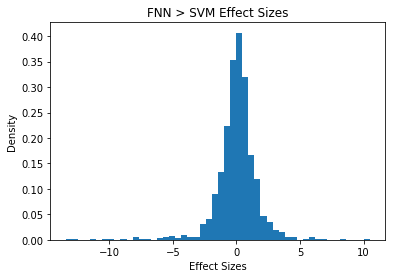

In [74]:
plt.hist(FNN_SVM_df['effect_size'].dropna(), bins=50, density=True);
plt.xlabel('Effect Sizes')
plt.ylabel('Density')
plt.title('FNN > SVM Effect Sizes')

In [84]:
scipy.stats.ttest_1samp(list(FNN_SVM_df['effect_size'].dropna()), popmean=0)

Ttest_1sampResult(statistic=0.4120715369775524, pvalue=0.6803545110278607)

In [85]:
scipy.stats.wilcoxon(list(FNN_SVM_df['effect_size'].dropna()))

WilcoxonResult(statistic=392069.0, pvalue=0.007414375067246994)

# Altair Plots #

In [99]:
all_df_dict = {}

all_df_dict['CHEMBL'] = list(canonical_order) + list(canonical_order) + list(canonical_order)
all_df_dict['fold'] = ['fold0']*1310 + ['fold1']*1310 + ['fold2']*1310
all_df_dict['train_imb'] = list(fold_info_df['train_imb0']) + \
                           list(fold_info_df['train_imb1']) + list(fold_info_df['train_imb2'])
all_df_dict['test_imb'] = list(fold_info_df['test_imb0']) + \
                          list(fold_info_df['test_imb1']) + list(fold_info_df['test_imb2'])
all_df_dict['train_size'] = list(fold_info_df['train_size0']) + \
                           list(fold_info_df['train_size1']) + list(fold_info_df['train_size2'])
all_df_dict['test_size'] = list(fold_info_df['test_size0']) + \
                          list(fold_info_df['test_size1']) + list(fold_info_df['test_size2'])
all_df_dict['knn_auc'] = list(knn_df['fold0']) + \
                          list(knn_df['fold1']) + list(knn_df['fold2'])
all_df_dict['nb_auc'] = list(nb_df['fold0']) + \
                          list(nb_df['fold1']) + list(nb_df['fold2'])
all_df_dict['fnn_auc'] = list(fnn_df['fold0']) + \
                          list(fnn_df['fold1']) + list(fnn_df['fold2'])
all_df_dict['svm_auc'] = list(svm_df['fold0']) + \
                          list(svm_df['fold1']) + list(svm_df['fold2'])
all_df_dict['rf_auc'] = list(rf_df['fold0']) + \
                          list(rf_df['fold1']) + list(rf_df['fold2'])
all_df_dict['gc_auc'] = list(gc_df['fold0']) + \
                          list(gc_df['fold1']) + list(gc_df['fold2'])
all_df_dict['weave_auc'] = list(weave_df['fold0']) + \
                          list(weave_df['fold1']) + list(weave_df['fold2'])
all_df_dict['lstm_auc'] = list(lstm_df['fold0']) + \
                          list(lstm_df['fold1']) + list(lstm_df['fold2'])

all_df = pd.DataFrame(all_df_dict)

In [103]:
all_df['winner'] = 'TIE'
all_df['mean_auc'] = 0

for index, row in all_df.iterrows():
    
    knn_score = row['knn_auc']
    nb_score = row['nb_auc']
    fnn_score = row['fnn_auc']
    svm_score = row['svm_auc']
    rf_score = row['rf_auc']
    gc_score = row['gc_auc']
    weave_score = row['weave_auc']
    lstm_score = row['lstm_auc']
    
    top_score = np.max(np.array([knn_score, nb_score, fnn_score,
                       svm_score, rf_score, gc_score,
                       weave_score, lstm_score]))
    
    winner = 'TIE'
    num_winners = 0
    if knn_score == top_score:
        winner = 'KNN'
        num_winners += 1
    if nb_score == top_score:
        winner = 'NB'
        num_winners += 1
    if fnn_score == top_score:
        winner = 'FNN'
        num_winners += 1
    if svm_score == top_score:
        winner = 'SVM'
        num_winners += 1
    if rf_score == top_score:
        winner = 'RF'
        num_winners += 1
    if gc_score == top_score:
        winner = 'GC'
        num_winners += 1
    if weave_score == top_score:
        winner = 'WEAVE'
        num_winners += 1
    if lstm_score == top_score:
        winner = 'LSTM'
        num_winners += 1
        
    if num_winners > 1:
        winner = 'TIE'
    
    all_df.loc[index,'winner'] = winner
    all_df.loc[index,'avg_auc'] = np.mean(np.array([knn_score, nb_score, fnn_score,
                       svm_score, rf_score, gc_score,
                       weave_score, lstm_score]))
     

In [104]:
all_df.head()

,CHEMBL,fold,train_imb,test_imb,train_size,test_size,knn_auc,nb_auc,fnn_auc,svm_auc,rf_auc,gc_auc,weave_auc,lstm_auc,winner,mean_auc,avg_auc
0,CHEMBL1614338,fold0,0.833333,0.875000,24,16,0.785714,0.714286,0.785714,0.535714,0.464286,0.375000,0.250000,0.535714,FNN,0,0.555804
1,CHEMBL1243971,fold0,0.555556,0.500000,9,36,0.651235,0.956790,0.691358,0.867284,0.500000,0.787037,0.475309,0.540123,NB,0,0.683642
2,CHEMBL1614044,fold0,0.773585,0.714286,53,14,0.750000,0.425000,0.675000,0.750000,0.650000,0.787500,0.700000,0.575000,GC,0,0.664062
3,CHEMBL2045986,fold0,0.929412,0.900000,85,10,0.666667,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,TIE,0,0.958333
4,CHEMBL618396,fold0,0.865385,0.863636,52,22,0.912281,0.929825,0.842105,0.964912,0.982456,1.000000,1.000000,0.929825,TIE,0,0.945175


#### See how often each algorithm wins ####

In [105]:
all_df['winner'].value_counts(normalize=True)

SVM      0.246056
FNN      0.246056
GC       0.098982
NB       0.096947
LSTM     0.079135
RF       0.077099
WEAVE    0.075064
KNN      0.057252
TIE      0.023410
Name: winner, dtype: float64

#### How about for the bigger samples sizes: ####

In [106]:
all_df.loc[all_df['test_size']>1000, 'winner'].value_counts(normalize=True)

SVM      0.602273
FNN      0.335227
GC       0.022727
LSTM     0.015152
WEAVE    0.013258
RF       0.007576
NB       0.001894
KNN      0.001894
Name: winner, dtype: float64

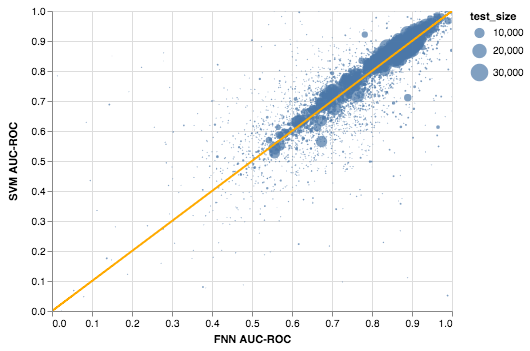

In [107]:
source = all_df

points = alt.Chart(source).mark_circle().encode(
    alt.X('fnn_auc'),
    alt.Y('svm_auc'),
    size='test_size',
    #color='color:Q',
    tooltip=['CHEMBL', 'fold', 'train_size', 'train_imb', 'test_size', 'test_imb' ]
).interactive()

poly_data = pd.DataFrame({
    'x': list(np.linspace(0,1,100)),
    'y': list(np.linspace(0,1,100)),
})
line = alt.Chart(poly_data).mark_line().encode(
    x=alt.X('x',title='FNN AUC-ROC'),
    y=alt.Y('y',title='SVM AUC-ROC'),
    color=alt.value("#FFAA00")
)

points+line

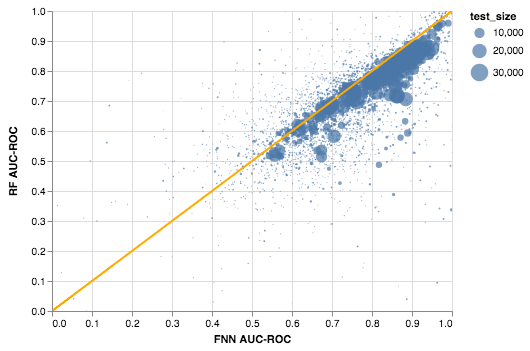

In [108]:
source = all_df

points = alt.Chart(source).mark_circle().encode(
    alt.X('fnn_auc'),
    alt.Y('rf_auc'),
    size='test_size',
    #color='color:Q',
    tooltip=['CHEMBL', 'fold', 'train_size', 'train_imb', 'test_size', 'test_imb' ]
).interactive()

poly_data = pd.DataFrame({
    'x': list(np.linspace(0,1,100)),
    'y': list(np.linspace(0,1,100)),
})
line = alt.Chart(poly_data).mark_line().encode(
    x=alt.X('x',title='FNN AUC-ROC'),
    y=alt.Y('y',title='RF AUC-ROC'),
    color=alt.value("#FFAA00")
)

points+line

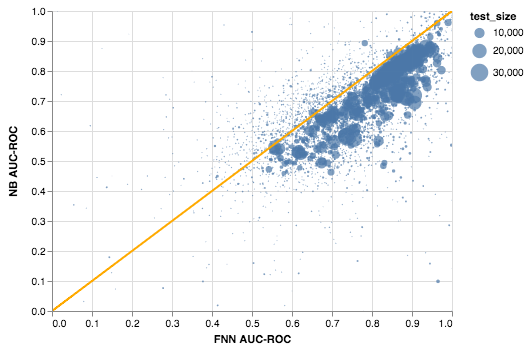

In [109]:
source = all_df

points = alt.Chart(source).mark_circle().encode(
    alt.X('fnn_auc'),
    alt.Y('nb_auc'),
    size='test_size',
    #color='color:Q',
    tooltip=['CHEMBL', 'fold', 'train_size', 'train_imb', 'test_size', 'test_imb' ]
).interactive()

poly_data = pd.DataFrame({
    'x': list(np.linspace(0,1,100)),
    'y': list(np.linspace(0,1,100)),
})
line = alt.Chart(poly_data).mark_line().encode(
    x=alt.X('x',title='FNN AUC-ROC'),
    y=alt.Y('y',title='NB AUC-ROC'),
    color=alt.value("#FFAA00")
)

points+line

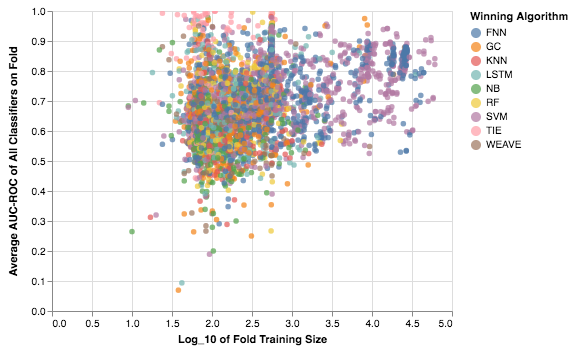

In [93]:
all_df['log_train_size'] = all_df['train_size'].apply(lambda x: np.log10(x))
source = all_df

points = alt.Chart(source).mark_circle().encode(
    alt.X('log_train_size', title='Log_10 of Fold Training Size'),
    alt.Y('avg_auc', title='Average AUC-ROC of All Classifiers on Fold'),
    color=alt.Color('winner', title='Winning Algorithm'),
    #color='color:Q',
    tooltip=['CHEMBL', 'fold', 'train_size', 'train_imb', 'test_size', 'test_imb', 'winner' ]
).interactive()

points

# See how well AUC-ROC scores correlate with AUC-PRC scores: #

Unfortunately, data on this is only aviable for the FNN classifier:

In [98]:
fnn_pr_df = pd.read_csv('./ecfp6/dnn_prc.csv')
fnn_pr_df = fnn_pr_df[['ECFP6: fold0', 'ECFP6: fold1', 'ECFP6: fold2']]
fnn_pr_df = fnn_pr_df.rename(columns={'ECFP6: fold0': "fold0",
                       'ECFP6: fold1': "fold1",
                       'ECFP6: fold2': "fold2",})
fnn_pr_df['mean_auc'] = fnn_pr_df.mean(axis=1)
fnn_pr_df['std_auc'] = fnn_pr_df.std(axis=1)
fnn_pr_df.head()

,fold0,fold1,fold2,mean_auc,std_auc
0,0.968963,1.000000,0.988130,0.985698,0.012787
1,0.799150,0.416667,0.655556,0.623791,0.157755
2,0.863768,0.986474,0.644830,0.831691,0.141308
3,1.000000,0.959540,1.000000,0.986513,0.019073
4,0.968510,1.000000,1.000000,0.989503,0.014845


In [113]:
fnn_roc_prc_dict = {}

fnn_roc_prc_dict['CHEMBL'] = list(canonical_order) + list(canonical_order) + list(canonical_order)
fnn_roc_prc_dict['fold'] = ['fold0']*1310 + ['fold1']*1310 + ['fold2']*1310
fnn_roc_prc_dict['train_imb'] = list(fold_info_df['train_imb0']) + \
                           list(fold_info_df['train_imb1']) + list(fold_info_df['train_imb2'])
fnn_roc_prc_dict['test_imb'] = list(fold_info_df['test_imb0']) + \
                          list(fold_info_df['test_imb1']) + list(fold_info_df['test_imb2'])
fnn_roc_prc_dict['train_size'] = list(fold_info_df['train_size0']) + \
                           list(fold_info_df['train_size1']) + list(fold_info_df['train_size2'])
fnn_roc_prc_dict['test_size'] = list(fold_info_df['test_size0']) + \
                          list(fold_info_df['test_size1']) + list(fold_info_df['test_size2'])
fnn_roc_prc_dict['fnn_auc_roc'] = list(fnn_df['fold0']) + \
                          list(fnn_df['fold1']) + list(fnn_df['fold2'])
fnn_roc_prc_dict['fnn_auc_prc'] = list(fnn_pr_df['fold0']) + \
                          list(fnn_pr_df['fold1']) + list(fnn_pr_df['fold2'])

fnn_roc_prc_df = pd.DataFrame(fnn_roc_prc_dict)

In [116]:
fnn_roc_prc_df.head()

,CHEMBL,fold,train_imb,test_imb,train_size,test_size,fnn_auc_roc,fnn_auc_prc
0,CHEMBL1614338,fold0,0.833333,0.875000,24,16,0.785714,0.968963
1,CHEMBL1243971,fold0,0.555556,0.500000,9,36,0.691358,0.799150
2,CHEMBL1614044,fold0,0.773585,0.714286,53,14,0.675000,0.863768
3,CHEMBL2045986,fold0,0.929412,0.900000,85,10,1.000000,1.000000
4,CHEMBL618396,fold0,0.865385,0.863636,52,22,0.842105,0.968510


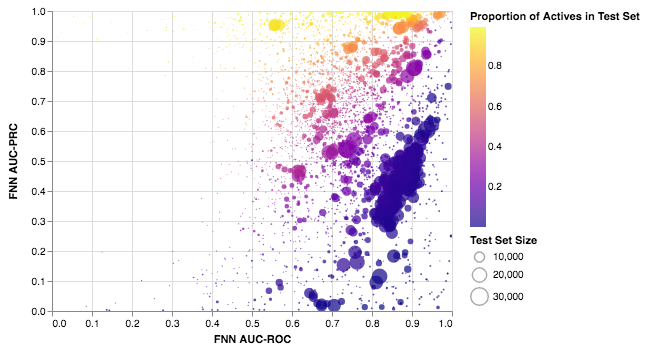

In [122]:
source = fnn_roc_prc_df

points = alt.Chart(source).mark_circle().encode(
    alt.X('fnn_auc_roc', title='FNN AUC-ROC'),
    alt.Y('fnn_auc_prc', title='FNN AUC-PRC'),
    size=alt.Size('test_size',title='Test Set Size'),
    color=alt.Color('test_imb',title='Proportion of Actives in Test Set',
                    scale=alt.Scale(scheme='plasma',)),
    #color='color:Q',
    tooltip=['CHEMBL', 'fold', 'train_size', 'train_imb', 'test_size', 'test_imb' ]
).interactive()

points